<h1>What Is Data Visualization?</h1>
<hr>
<h3>“The representation of information in the form of a chart, diagram, picture, etc.”</h3>

<h6>
Use a simple bar chart showing the number of accidents per year (2019–2022) to illustrate how raw numbers become instantly understandable when visualized.
</h6>

In [2]:
import pandas as pd
df = pd.read_csv('dataset\\uk_road_accident.csv')


In [3]:
# Step 1: Convert to string only if not null
df['Accident Date'] = df['Accident Date'].astype(str)
# Step 2: Replace '/' with '-' safely
df['Accident Date'] = df['Accident Date'].apply(lambda x: x.replace('/', '-') if pd.notnull(x) else x)
# Step 3: Strip whitespace
df['Accident Date'] = df['Accident Date'].apply(lambda x: x.strip() if pd.notnull(x) else x)
# Step 4: Convert to datetime                                 
df['Accident Date'] = pd.to_datetime(df['Accident Date'], dayfirst=True, errors='coerce')

df.dtypes
df.isnull().sum()

df['Year'] = df['Accident Date'].dt.year
df['Month'] =  df['Accident Date'].dt.month
df['Day'] =  df['Accident Date'].dt.day
df['DayOfWeek'] =  df['Accident Date'].dt.dayofweek
df.isnull().sum()

Index                          0
Accident_Severity              0
Accident Date                  0
Latitude                      25
Light_Conditions               0
District Area                  0
Longitude                     26
Number_of_Casualties           0
Number_of_Vehicles             0
Road_Surface_Conditions      726
Road_Type                   4520
Urban_or_Rural_Area           15
Weather_Conditions         14128
Vehicle_Type                   0
Year                           0
Month                          0
Day                            0
DayOfWeek                      0
dtype: int64

<Axes: xlabel='Year'>

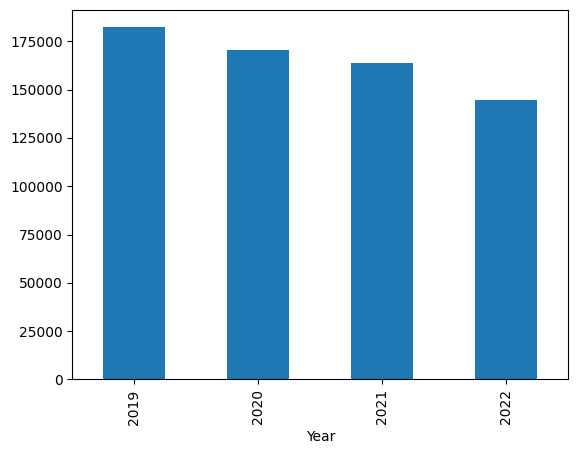

In [4]:
# Example: Bar chart of accident counts per year
import matplotlib.pyplot as plt
df.groupby('Year').size().plot(kind='bar')

<h1>Why Is It Important?</h1>
<ul>
    <li><h4>Helps identify patterns, trends, and outliers.</h4> </li>
    <li><h4>Speeds up decision-making.</h4></li>
    <li><h4>Makes data accessible to non-technical stakeholders.</h4></li>
</ul>

<h4>
📊 Example Visualization: Line chart showing monthly accident trends over time. This reveals seasonal spikes (e.g., winter months, holidays).
</h4>

<h1>Types of Visualizations (with Dataset Examples)</h1>
<table>
    <tr>
        <th>
            Visualization Type
        </th>
        <th>
            UK Dataset Example
        </th>
        <th>
            Purpose
        </th>
    </tr>
    <tr>
        <td>
            Histogram
        </td>
        <td>
            Distribution of accident severity
        </td>
        <td>
            Show frequency of severity levels
        </td>
    </tr>
    <tr>
        <td>
            Heatmap
        </td>
        <td>
            Accidents by region vs. time of day
        </td>
        <td>
            Reveal hotspots and peak hours
        </td>
    </tr>
    <tr>
        <td>
            Box Plot
        </td>
        <td>
            Casualty age distribution
        </td>
        <td>
            Spot outliers and age concentration
        </td>
    </tr>
    <tr>
        <td>
            Pie Chart
        </td>
        <td>
            Proportion of accident causes
        </td>
        <td>
            Show relative contribution
        </td>
    </tr>
    <tr>
        <td>
            Stacked Bar Chart
        </td>
        <td>
            Road type vs. lighting condition
        </td>
        <td>
            Compare accident counts across categories
        </td>
    </tr>
</table>

<h1>Univariate Plotting </h1>
<h2>Focus on one variable at a time.</h2>

<h4>📌 Example: Histogram of vehicle types involved </h4>


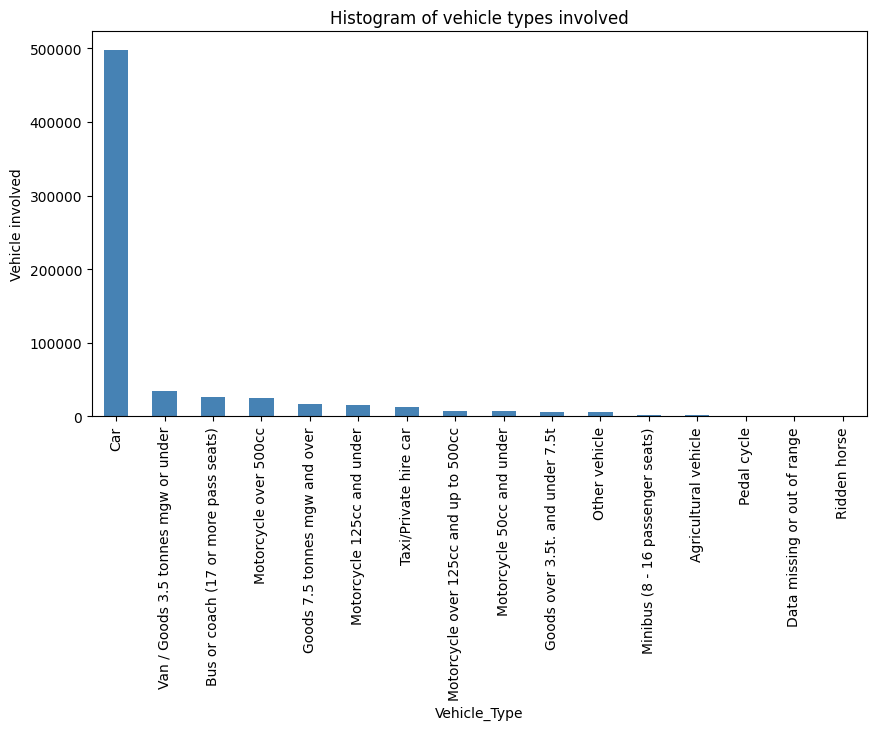

In [25]:
df['Vehicle_Type'].value_counts().plot(kind='bar', figsize=(10,5), color="steelblue")
plt.title("Histogram of vehicle types involved")
plt.ylabel("Vehicle involved")
plt.show()


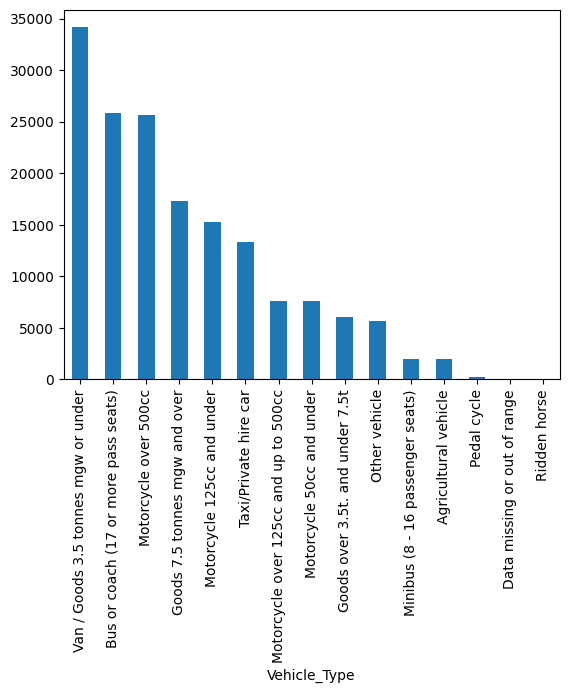

In [6]:
nocar_df = df[df['Vehicle_Type'] != 'Car']
nocar_df['Vehicle_Type'].value_counts().plot(kind='bar')
plt.show()

<h1>Advanced Groupby Functions</h1>
<ul>
    <li>UNSTACK | unstack()</li>
    <li>RESET_INDEX | reset_index()</li>
</ul>

In [7]:
df.dtypes

severity = df.groupby(['Accident_Severity', 'Year']).size()
severity

Accident_Severity  Year
Fatal              2019      2714
                   2020      2341
                   2021      2057
                   2022      1549
Serious            2019     24322
                   2020     23121
                   2021     21997
                   2022     18777
Slight             2019    155079
                   2020    145129
                   2021    139500
                   2022    124093
dtype: int64

In [8]:
severity2 = df.groupby(['Accident_Severity', 'Year']).size()
severity2.unstack()

Year,2019,2020,2021,2022
Accident_Severity,,,,
Fatal,2714,2341,2057,1549
Serious,24322,23121,21997,18777
Slight,155079,145129,139500,124093


In [9]:
severity3 = df.groupby(['Accident_Severity', 'Year']).size()
severity3.unstack(level=0)

Accident_Severity,Fatal,Serious,Slight
Year,,,
2019,2714,24322,155079
2020,2341,23121,145129
2021,2057,21997,139500
2022,1549,18777,124093


In [10]:
severity3 = df.groupby(['Accident_Severity', 'Year']).size()
severity3.reset_index()

,Accident_Severity,Year,0
0,Fatal,2019,2714
1,Fatal,2020,2341
2,Fatal,2021,2057
3,Fatal,2022,1549
4,Serious,2019,24322
5,Serious,2020,23121
6,Serious,2021,21997
7,Serious,2022,18777
8,Slight,2019,155079
9,Slight,2020,145129


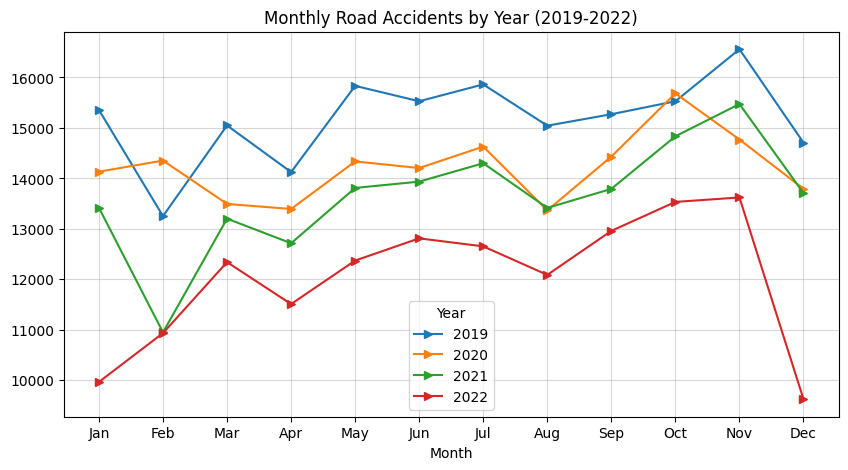

In [11]:
import matplotlib.pyplot as plt

# 1. Group by Year FIRST, then Month (critical order!)
monthly_data = df.groupby(['Year', 'Month']).size()

# 2. Unstack Year to create separate lines for each year
monthly_data = monthly_data.unstack(level=0)

# 3. Plot with clean formatting (only 4 lines!)
monthly_data.plot(
    marker='>', 
    figsize=(10, 5),
    title='Monthly Road Accidents by Year (2019-2022)'
)
plt.xticks(range(1, 13), ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
#plt.bbox_to_achor(
plt.grid(alpha=0.5)
plt.show()

In [12]:
london_df = df[df['District Area'] == 'City of London']

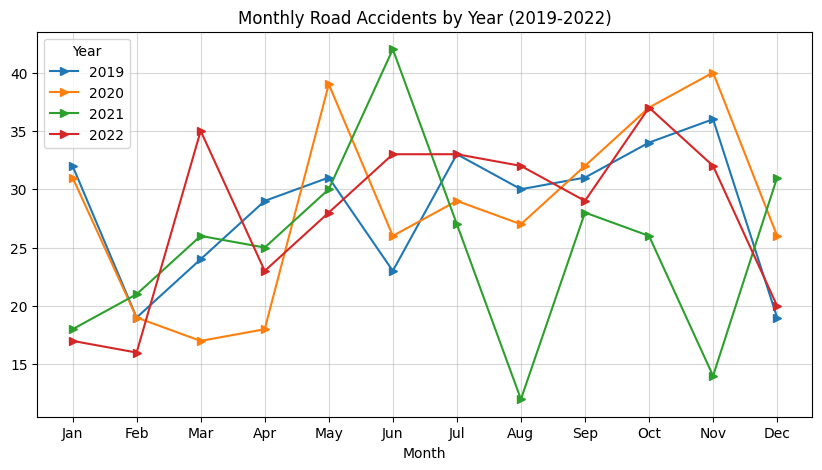

In [13]:
# 1. Group by Year FIRST, then Month (critical order!)
monthly_data = london_df.groupby(['Year', 'Month']).size()

# 2. Unstack Year to create separate lines for each year
monthly_data = monthly_data.unstack(level=0)

# 3. Plot with clean formatting (only 4 lines!)
monthly_data.plot(
    marker='>', 
    figsize=(10, 5),
    title='Monthly Road Accidents by Year (2019-2022)'
)
plt.xticks(range(1, 13), ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
#plt.bbox_to_achor(
plt.grid(alpha=0.5)
plt.show()

In [14]:
df['District Area'].unique()

array(['Kensington and Chelsea', 'Westminster', 'Richmond upon Thames',
       'Hammersmith and Fulham', 'Hounslow', 'Tower Hamlets',
       'City of London', 'Southwark', 'Camden', 'Hackney', 'Islington',
       'Barnet', 'Brent', 'Haringey', 'Merton', 'Ealing', 'Enfield',
       'Greenwich', 'Newham', 'London Airport (Heathrow)', 'Hillingdon',
       'Waltham Forest', 'Redbridge', 'Barking and Dagenham', 'Bromley',
       'Havering', 'Croydon', 'Lambeth', 'Wandsworth', 'Sutton', 'Bexley',
       'Lewisham', 'Harrow', 'Kingston upon Thames', 'Barrow-in-Furness',
       'South Lakeland', 'Carlisle', 'Eden', 'Allerdale', 'Copeland',
       'Fylde', 'Blackpool', 'Wyre', 'Lancaster', 'Chorley',
       'West Lancashire', 'South Ribble', 'Preston',
       'Blackburn with Darwen', 'Hyndburn', 'Ribble Valley', 'Burnley',
       'Pendle', 'Rossendale', 'Wirral', 'Liverpool', 'Sefton',
       'Knowsley', 'St. Helens', 'Manchester', 'Salford', 'Tameside',
       'Stockport', 'Bolton', 'Wigan', '

<h1>PIE CHART IN MATPLOTLIB </h1>

In [15]:
severity = df['Accident_Severity'].value_counts()

In [16]:
severity.index

Index(['Slight', 'Serious', 'Fatal'], dtype='object', name='Accident_Severity')

In [17]:
severity.values

array([563801,  88217,   8661])

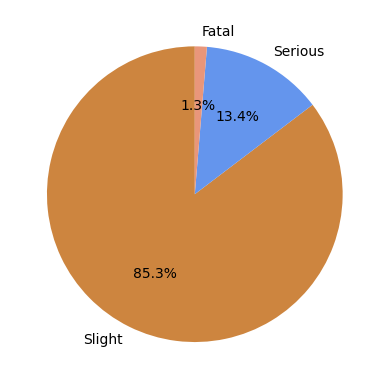

In [18]:
plt.pie(severity, 
        labels = severity.index,
        startangle= 90,
        autopct = '%1.1f%%',
        colors = ['Peru','Cornflowerblue','Darksalmon'])
plt.show()

In [19]:
pip install folium

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [20]:
import folium
from folium.plugins import HeatMap

locations = list(zip(london_df['Latitude'], london_df['Longitude']))

m = folium.Map(locations=[london_df['Latitude'].mean(), london_df['Longitude'].mean()])

HeatMap(locations).add_to(m)

m.save('accident_heatmap.html')
m

<hr>
<br>
<h2>Q1. How do accidents vary by year?</h2>
<br>
<hr>

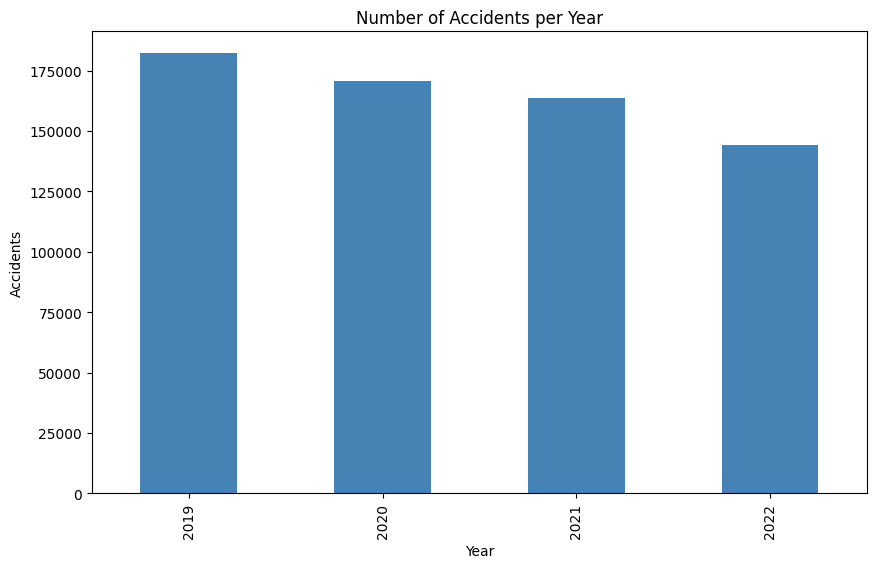

In [34]:
df.groupby("Year").size().plot(kind="bar", figsize=(10,6), color="steelblue")
plt.title("Number of Accidents per Year")
plt.ylabel("Accidents")
plt.show()

<hr>
<br>
<h2>INSIGHTS : Accident change every year. Some year high, some year low. Maybe because more car on road, or new safety rule from government.</h2>
<br>
<hr>

<hr>
<br>
<h2>Q2. How do monthly accident trends vary in Manchester across different years?</h2>
<br>
<hr>

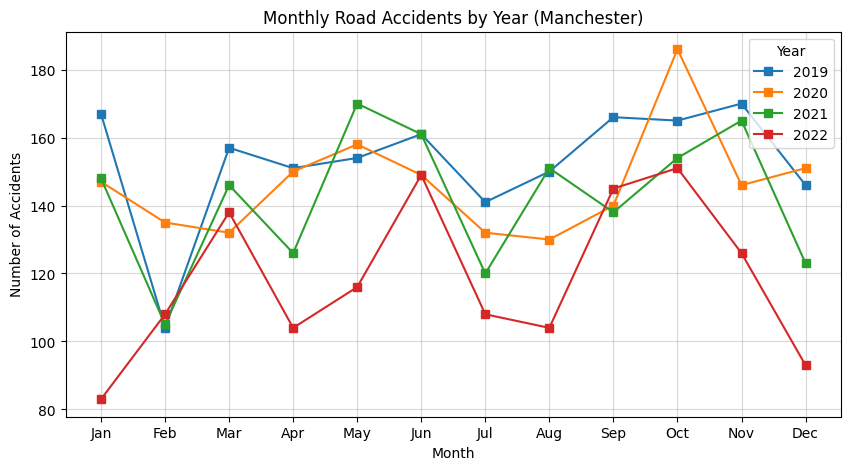

In [30]:
manchester_df = df[df["District Area"] == "Manchester"]

monthly_data = manchester_df.groupby(["Year", "Month"]).size()
monthly_data = monthly_data.unstack(level=0)

monthly_data.plot(
    marker="s",
    figsize=(10, 5),
    title="Monthly Road Accidents by Year (Manchester)"
)
plt.xticks(
    range(1, 13), 
    ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]
)
plt.grid(alpha=0.5)
plt.ylabel("Number of Accidents")
plt.show()

<hr>
<br>
<h2>INSIGHTS : In Manchester, accident not same every month. Summer and busy month more accident, quiet month less. Pattern repeat but each year little different.</h2>
<br>
<hr>

<hr>
<br>
<h2>Q3. How does accident severity distribute in Birmingham?</h2>
<br>
<hr>

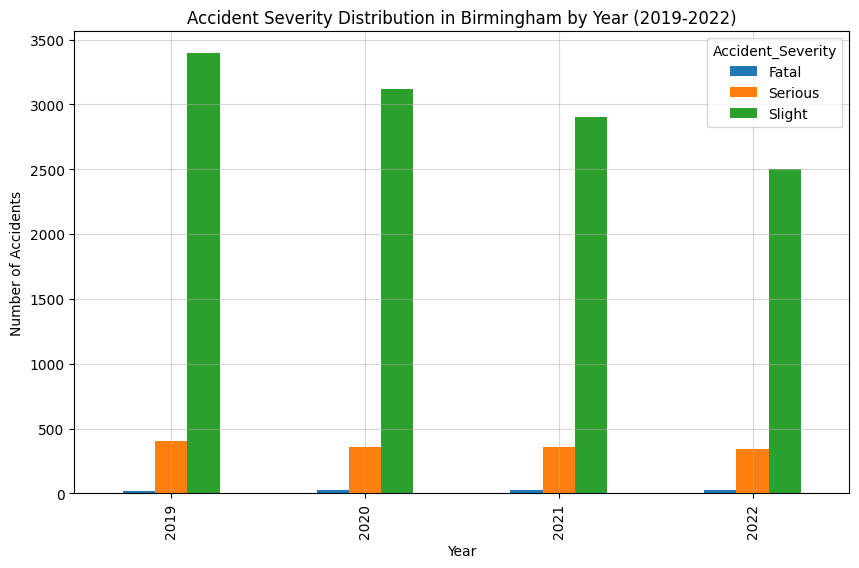

In [37]:
birmingham_df = df[df["District Area"] == "Birmingham"]

severity_data = birmingham_df.groupby(["Year", "Accident_Severity"]).size()

severity_data = severity_data.unstack(level=1)

severity_data.plot(
    kind="bar",
    figsize=(10, 6),
    title="Accident Severity Distribution in Birmingham by Year (2019-2022)"
)
plt.ylabel("Number of Accidents")
plt.grid(alpha=0.5)
plt.show()

<hr>
<br>
<h2>INSIGHTS : In Birmingham, most accident only slight. Serious accident smaller, fatal very few. But even small fatal number already big problem.</h2>
<br>
<hr>

<hr>
<br>
<h2>Q4. Which district has the highest accident density?</h2>
<br>
<hr>

In [39]:
birmingham_df = df[df["District Area"] == "Birmingham"].dropna(subset=["Latitude","Longitude"])
locations = list(zip(birmingham_df["Latitude"], birmingham_df["Longitude"]))

m = folium.Map(location=[birmingham_df["Latitude"].mean(), birmingham_df["Longitude"].mean()], zoom_start=10)
HeatMap(locations, radius=7).add_to(m)
m.save("birmingham_accident_heatmap.html")
m

<hr>
<br>
<h2>INSIGHTS : Accident in Birmingham city center very many. Main road and round road show big cluster. Outside city less accident because traffic not heavy.</h2>
<br>
<hr>

<hr>
<br>
<h2>Q5. Do accidents in darkness show different hotspots than daylight?</h2>
<br>
<hr>

In [40]:
urban_df = df[df["Urban_or_Rural_Area"] == "Urban"].dropna(subset=["Latitude","Longitude"])
locations = list(zip(urban_df["Latitude"], urban_df["Longitude"]))

m2 = folium.Map(location=[urban_df["Latitude"].mean(), urban_df["Longitude"].mean()], zoom_start=6)
HeatMap(locations, radius=7).add_to(m2)
m2.save("urban_accident_heatmap.html")
m2

<hr>
<br>
<h2>INSIGHTS : Urban road show many accident close together. Rural road accident less and spread out. This because city have more car and busy street.</h2>
<br>
<hr>

<hr>
<br>
<h2>Q6. How does accident severity distribute in Birmingham?</h2>
<br>
<hr>

In [41]:
night_df = df[df["Light_Conditions"].str.contains("Dark", na=False)].dropna(subset=["Latitude","Longitude"])
locations = list(zip(night_df["Latitude"], night_df["Longitude"]))

m3 = folium.Map(location=[night_df["Latitude"].mean(), night_df["Longitude"].mean()], zoom_start=6)
HeatMap(locations, radius=8, gradient={0.3:"purple", 0.6:"orange", 1.0:"red"}).add_to(m3)
m3.save("night_accident_heatmap.html")
m3

<hr>
<br>
<h2>INSIGHTS : At night, accident hotspot in highway and dark road. In daytime, accident more spread in different place. Darkness make accident risk higher.</h2>
<br>
<hr>